# Inspect the single-lineage model run on the colorectal data (007)

 Model attributes:

- sgRNA | gene varying intercept
- RNA and CN varying effects per gene
- correlation between gene varying effects modeled using the multivariate normal and Cholesky decomposition (non-centered parameterization)
- target gene mutation variable and cancer gene comutation variable.
- varying effect for cell line and varying copy number effect for cell line

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from time import time

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from IPython.display import Markdown, display
from matplotlib.lines import Line2D

In [3]:
from speclet.analysis.arviz_analysis import extract_coords_param_names
from speclet.bayesian_models.lineage_hierarchical_nb import LineageHierNegBinomModel
from speclet.data_processing.common import head_tail
from speclet.io import modeling_data_dir, models_dir
from speclet.managers.data_managers import CrisprScreenDataManager, broad_only
from speclet.plot import set_speclet_theme
from speclet.project_configuration import arviz_config

In [4]:
# Notebook execution timer.
notebook_tic = time()

# Plotting setup.
set_speclet_theme()
%config InlineBackend.figure_format = "retina"
arviz_config()

## Data

In [5]:
saved_model_dir = models_dir() / "hnb-single-lineage-colorectal-007_PYMC_NUMPYRO"

In [6]:
with open(saved_model_dir / "description.txt") as f:
    model_description = "".join(list(f))

print(model_description)

name: 'hnb-single-lineage-colorectal-007'
fit method: 'PYMC_NUMPYRO'

--------------------------------------------------------------------------------

CONFIGURATION

{
    "name": "hnb-single-lineage-colorectal-007",
    "description": " Single lineage hierarchical negative binomial model for colorectal data from the Broad. Varying effect for cell line and varying effect for copy number per cell line. This model also uses a different transformation for the copy number data. The `max_tree_depth` is also increased with the intention to give the tuning process a little more room to experiment with, but it should not be used as the tree depth for the final draws. ",
    "active": true,
    "model": "LINEAGE_HIERARCHICAL_NB",
    "data_file": "modeling_data/lineage-modeling-data/depmap-modeling-data_colorectal.csv",
    "model_kwargs": {
        "lineage": "colorectal",
        "min_frac_cancer_genes": 0.2
    },
    "sampling_kwargs": {
        "pymc_mcmc": null,
        "pymc_advi": null

### Load posterior summary

In [7]:
crc_post_summary = pd.read_csv(saved_model_dir / "posterior-summary.csv").assign(
    var_name=lambda d: [x.split("[")[0] for x in d["parameter"]]
)
crc_post_summary.head()

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
0,mu_mu_a,0.090,0.004,0.084,0.096,0.000,0.000,209.0,415.0,1.01,mu_mu_a
1,mu_b,-0.001,0.000,-0.001,-0.001,0.000,0.000,3061.0,2997.0,1.00,mu_b
2,mu_m,-0.171,0.030,-0.216,-0.120,0.002,0.001,249.0,491.0,1.02,mu_m
3,sigma_a,0.183,0.001,0.182,0.184,0.000,0.000,1299.0,2068.0,1.00,sigma_a
4,alpha,7.913,0.007,7.902,7.924,0.000,0.000,3511.0,2481.0,1.00,alpha


### Load trace object

In [8]:
trace_file = saved_model_dir / "posterior.netcdf"
assert trace_file.exists()
trace = az.from_netcdf(trace_file)

### CRC data

In [9]:
crc_dm = CrisprScreenDataManager(
    modeling_data_dir()
    / "lineage-modeling-data"
    / "depmap-modeling-data_colorectal.csv",
    transformations=[broad_only],
)

In [10]:
crc_data = crc_dm.get_data(read_kwargs={"low_memory": False})
crc_data.head()

,sgrna,replicate_id,lfc,p_dna_batch,genome_alignment,hugo_symbol,screen,multiple_hits_on_gene,sgrna_target_chr,sgrna_target_pos,...,any_deleterious,any_tcga_hotspot,any_cosmic_hotspot,is_mutated,copy_number,lineage,lineage_subtype,primary_or_metastasis,is_male,age
0,AAAGCCCAGGAGTATGGGAG,LS513-311Cas9_RepA_p6_batch2,0.594321,2,chr2_130522105_-,CFC1B,broad,True,2,130522105,...,NaN,NaN,NaN,False,0.951337,colorectal,colorectal_adenocarcinoma,primary,True,63.0
1,AAATCAGAGAAACCTGAACG,LS513-311Cas9_RepA_p6_batch2,-0.363633,2,chr11_89916950_-,TRIM49D1,broad,True,11,89916950,...,NaN,NaN,NaN,False,0.945508,colorectal,colorectal_adenocarcinoma,primary,True,63.0
2,AACGTCTTTGAAGAAAGCTG,LS513-311Cas9_RepA_p6_batch2,-0.001343,2,chr5_71055421_-,GTF2H2,broad,True,5,71055421,...,NaN,NaN,NaN,False,1.428663,colorectal,colorectal_adenocarcinoma,primary,True,63.0
3,AACGTCTTTGAAGGAAGCTG,LS513-311Cas9_RepA_p6_batch2,0.367220,2,chr5_69572480_+,GTF2H2C,broad,True,5,69572480,...,NaN,NaN,NaN,False,1.428663,colorectal,colorectal_adenocarcinoma,primary,True,63.0
4,AAGAGGTTCCAGACTACTTA,LS513-311Cas9_RepA_p6_batch2,-1.180029,2,chrX_155898173_+,VAMP7,broad,True,X,155898173,...,NaN,NaN,NaN,False,0.466222,colorectal,colorectal_adenocarcinoma,primary,True,63.0


### Single lineage model

In [11]:
crc_model = LineageHierNegBinomModel(lineage="colorectal", min_frac_cancer_genes=0.2)

In [12]:
valid_crc_data = crc_model.data_processing_pipeline(crc_data.copy())
crc_mdl_data = crc_model.make_data_structure(valid_crc_data)

[INFO] 2022-08-07 06:29:46 [(lineage_hierarchical_nb.py:data_processing_pipeline:283] Processing data for modeling.
[INFO] 2022-08-07 06:29:46 [(lineage_hierarchical_nb.py:data_processing_pipeline:284] LFC limits: (-5.0, 5.0)
[WARNING] 2022-08-07 06:31:33 [(lineage_hierarchical_nb.py:data_processing_pipeline:335] number of data points dropped: 25
[INFO] 2022-08-07 06:31:35 [(lineage_hierarchical_nb.py:target_gene_is_mutated_vector:532] number of genes mutated in all cells lines: 0
[DEBUG] 2022-08-07 06:31:35 [(lineage_hierarchical_nb.py:target_gene_is_mutated_vector:535] Genes always mutated: 
[DEBUG] 2022-08-07 06:31:38 [(cancer_gene_mutation_matrix.py:_trim_cancer_genes:68] all_mut: {}
[INFO] 2022-08-07 06:31:38 [(cancer_gene_mutation_matrix.py:_trim_cancer_genes:77] Dropping 21 cancer genes.
[DEBUG] 2022-08-07 06:31:38 [(cancer_gene_mutation_matrix.py:_trim_cancer_genes:79] Dropped cancer genes: ['AKT1', 'AXIN1', 'BAX', 'ERBB3', 'GRIN2A', 'HIF1A', 'MAP2K1', 'MAX', 'MDM2', 'MLH1', 'M

In [26]:
crc_mdl_data.coords["cancer_gene"]

['APC', 'AXIN2', 'B2M', 'FBXW7', 'KRAS', 'MSH6', 'PIK3CA', 'POLD1', 'UBR5']

## Analysis

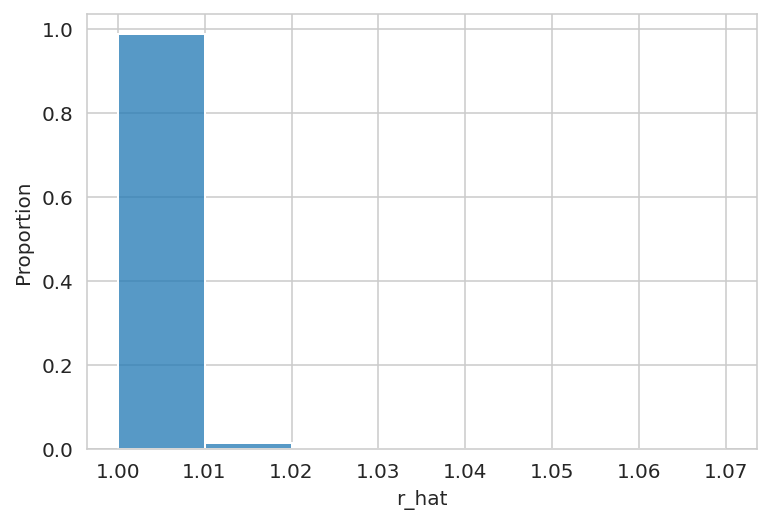

In [13]:
sns.histplot(x=crc_post_summary["r_hat"], binwidth=0.01, stat="proportion");

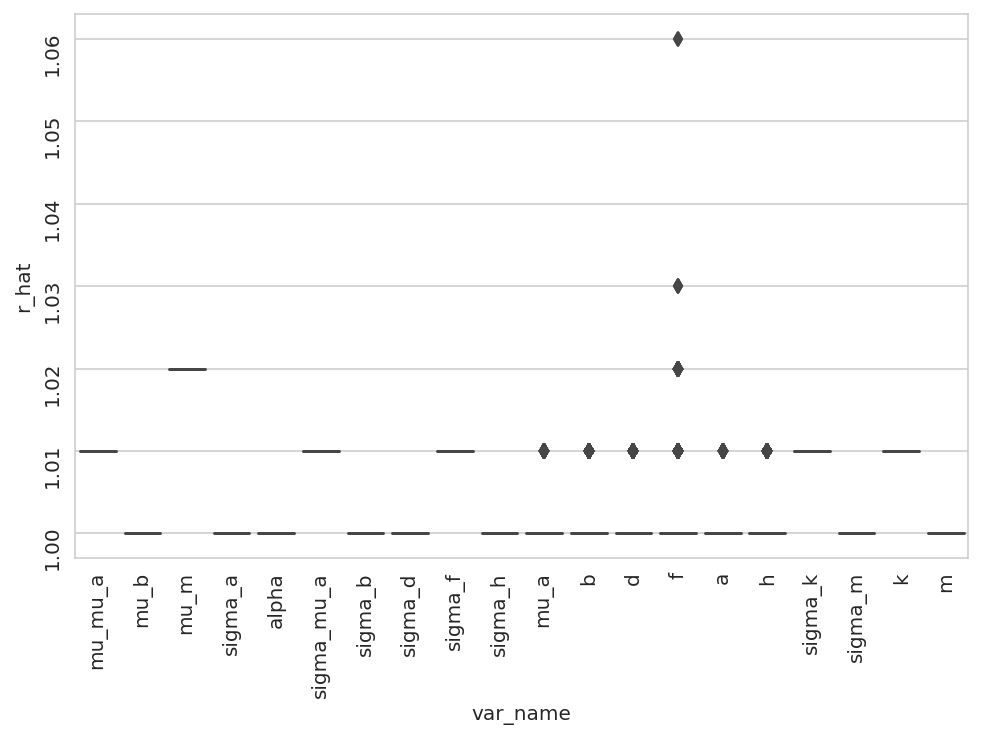

In [14]:
fig, ax = plt.subplots(figsize=(8, 5))
sns.boxplot(data=crc_post_summary, x="var_name", y="r_hat", ax=ax)
ax.tick_params(rotation=90)
plt.show()

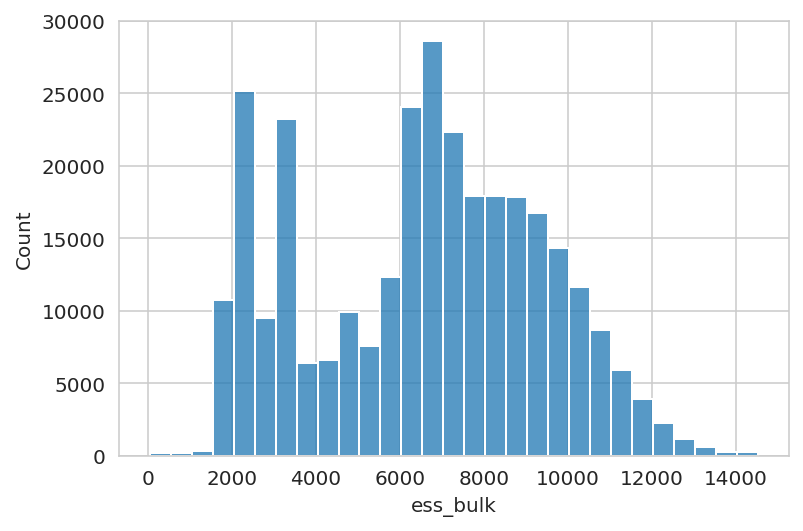

In [84]:
sns.histplot(data=crc_post_summary, x="ess_bulk", binwidth=500);

In [86]:
crc_post_summary.query("ess_bulk < 400")

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
0,mu_mu_a,0.090,0.004,0.084,0.096,0.000,0.000,209.0,415.0,1.01,mu_mu_a
2,mu_m,-0.171,0.030,-0.216,-0.120,0.002,0.001,249.0,491.0,1.02,mu_m
54453,f[ABHD11],0.002,0.014,-0.021,0.023,0.001,0.001,235.0,2709.0,1.02,f
54835,f[AIF1L],-0.005,0.015,-0.030,0.017,0.001,0.001,265.0,1660.0,1.02,f
54927,f[ALG12],-0.008,0.014,-0.030,0.012,0.001,0.001,235.0,1529.0,1.01,f
...,...,...,...,...,...,...,...,...,...,...,...
306664,k[ACH-001461],0.036,0.004,0.030,0.042,0.000,0.000,255.0,391.0,1.01,k
306665,k[ACH-001786],-0.013,0.004,-0.019,-0.006,0.000,0.000,256.0,505.0,1.01,k
306666,k[ACH-002023],-0.031,0.004,-0.037,-0.025,0.000,0.000,242.0,465.0,1.01,k
306667,k[ACH-002024],0.033,0.004,0.026,0.039,0.000,0.000,234.0,489.0,1.01,k


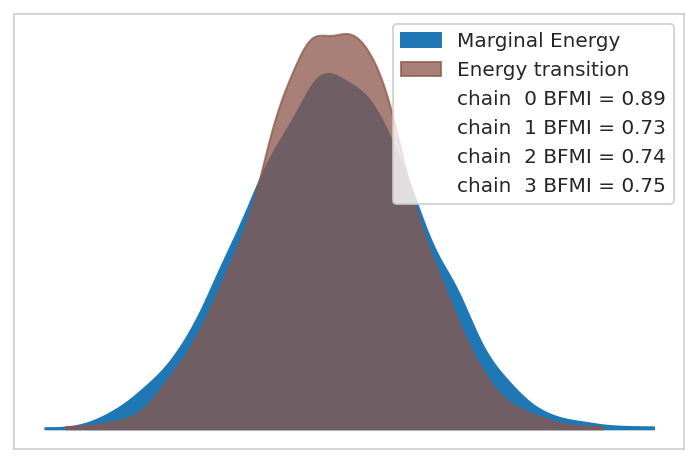

In [15]:
az.plot_energy(trace);

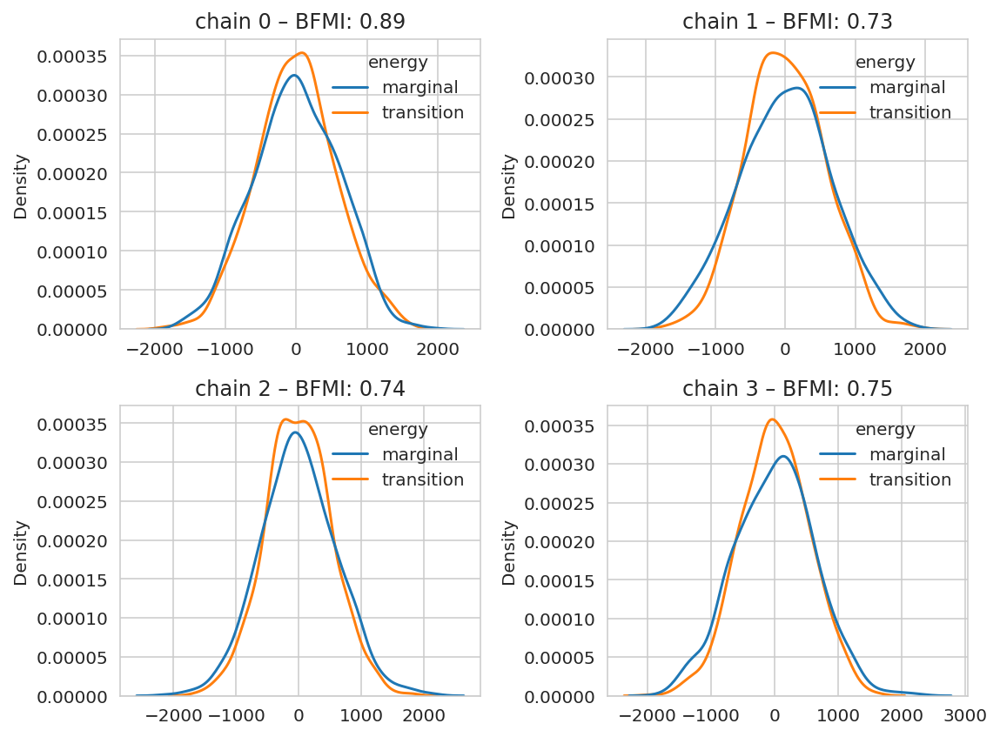

In [16]:
energy = trace.sample_stats.energy.values
marginal_e = pd.DataFrame((energy - energy.mean(axis=1)[:, None]).T).assign(
    energy="marginal"
)
transition_e = pd.DataFrame((energy[:, :-1] - energy[:, 1:]).T).assign(
    energy="transition"
)
energy_df = pd.concat([marginal_e, transition_e]).reset_index(drop=True)
bfmi = az.bfmi(trace)

fig, axes = plt.subplots(2, 2, figsize=(8, 6))
for i, ax in enumerate(axes.flatten()):
    sns.kdeplot(data=energy_df, x=i, hue="energy", ax=ax)
    ax.set_title(f"chain {i} – BFMI: {bfmi[i]:0.2f}")
    ax.set_xlabel(None)
    xmin, _ = ax.get_xlim()
    _, ymax = ax.get_ylim()
    ax.get_legend().set_frame_on(False)

fig.tight_layout()
plt.show()

In [17]:
stats = ["step_size", "n_steps", "tree_depth", "acceptance_rate", "energy"]
trace.sample_stats.get(stats).to_dataframe().groupby("chain").mean()

,step_size,n_steps,tree_depth,acceptance_rate,energy
chain,,,,,
0,0.008717,511.0,9.0,0.987547,1.911186e+07
1,0.008792,511.0,9.0,0.986314,1.911193e+07
2,0.008896,511.0,9.0,0.988655,1.911198e+07
3,0.008131,511.0,9.0,0.990426,1.911196e+07


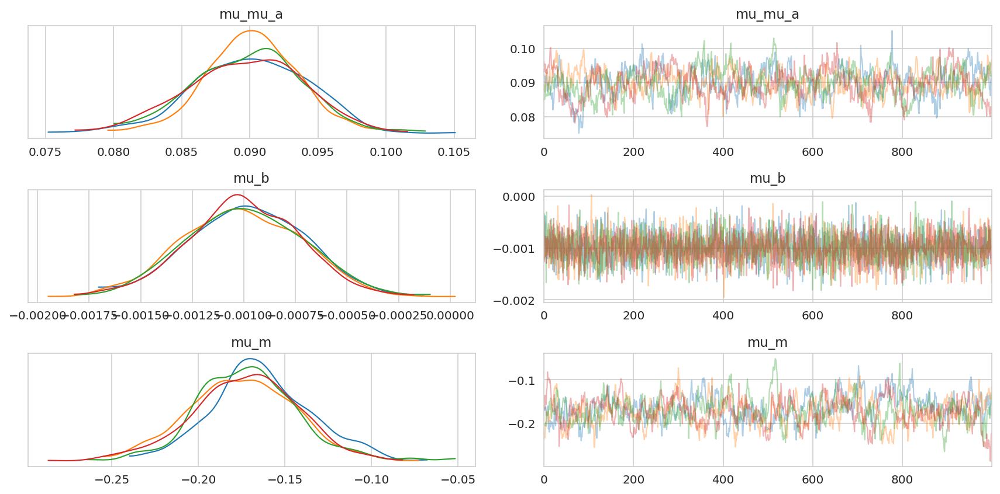

In [18]:
az.plot_trace(trace, var_names=["mu_mu_a", "mu_b", "mu_m"], compact=False)
plt.tight_layout()

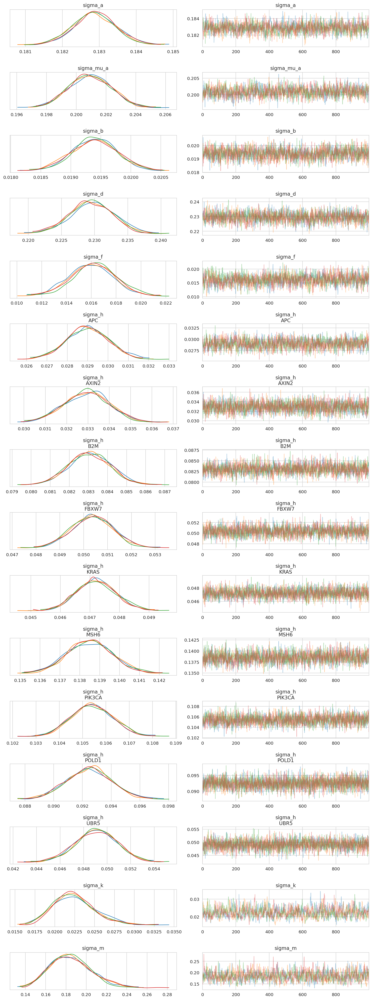

In [19]:
az.plot_trace(trace, var_names=["^sigma_*"], filter_vars="regex", compact=False)
plt.tight_layout()

In [20]:
az.summary(trace, var_names=["^sigma_.*$"], filter_vars="regex")

,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
sigma_a,0.183,0.001,0.182,0.184,0.000,0.0,1299.0,2068.0,1.00
sigma_mu_a,0.201,0.001,0.199,0.203,0.000,0.0,1132.0,2328.0,1.01
sigma_b,0.019,0.000,0.019,0.020,0.000,0.0,1539.0,2786.0,1.00
sigma_d,0.230,0.003,0.225,0.235,0.000,0.0,1429.0,2015.0,1.00
sigma_f,0.016,0.002,0.013,0.019,0.000,0.0,602.0,2016.0,1.01
sigma_h[APC],0.029,0.001,0.027,0.031,0.000,0.0,1220.0,2474.0,1.00
sigma_h[AXIN2],0.033,0.001,0.031,0.035,0.000,0.0,2095.0,3129.0,1.00
sigma_h[B2M],0.083,0.001,0.081,0.085,0.000,0.0,1703.0,2876.0,1.00
sigma_h[FBXW7],0.050,0.001,0.049,0.052,0.000,0.0,1897.0,2700.0,1.00
sigma_h[KRAS],0.047,0.001,0.046,0.048,0.000,0.0,1906.0,2947.0,1.00


In [21]:
sigmas = ["sigma_mu_a", "sigma_b", "sigma_d", "sigma_f", "sigma_k"]
trace.posterior.get(sigmas).mean(dim="draw").to_dataframe()

,sigma_mu_a,sigma_b,sigma_d,sigma_f,sigma_k
chain,,,,,
0,0.200923,0.019393,0.229846,0.015902,0.022532
1,0.200950,0.019379,0.229506,0.016051,0.022339
2,0.200941,0.019409,0.229623,0.016386,0.022294
3,0.200934,0.019406,0.229181,0.016139,0.022525


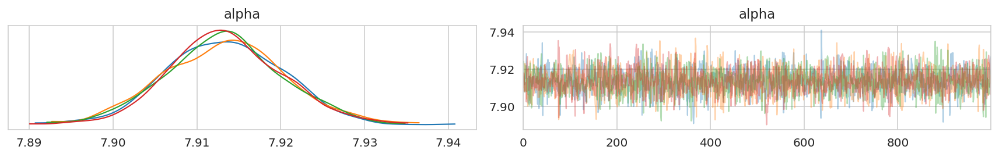

In [22]:
az.plot_trace(trace, var_names=["alpha"], compact=False)
plt.tight_layout()

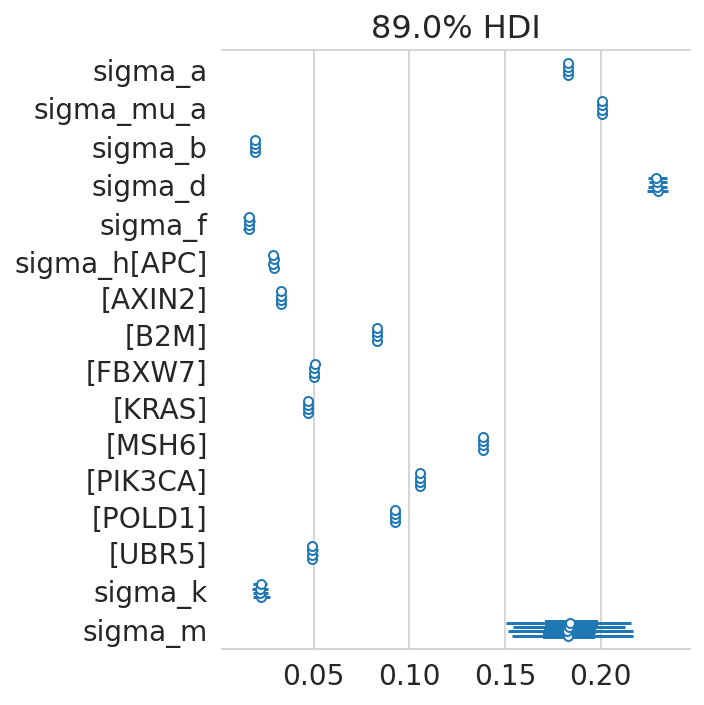

In [23]:
az.plot_forest(
    trace, var_names=["^sigma_*"], filter_vars="regex", combined=False, figsize=(5, 5)
)
plt.tight_layout()

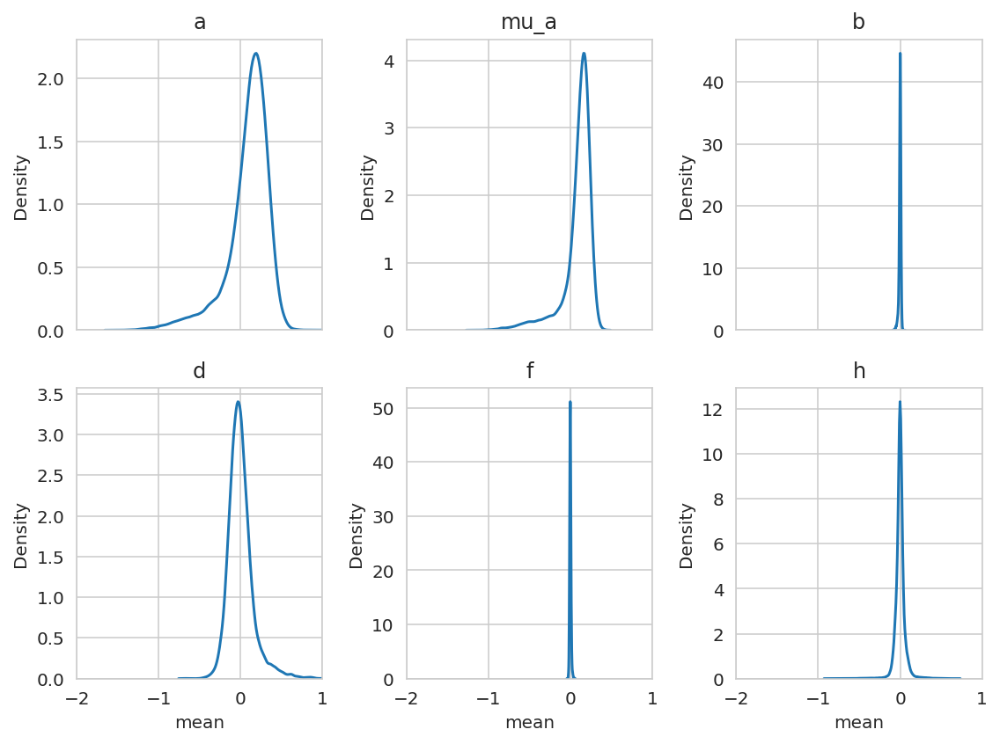

In [24]:
var_names = ["a", "mu_a", "b", "d", "f", "h"]
_, axes = plt.subplots(2, 3, figsize=(8, 6), sharex=True)
for ax, var_name in zip(axes.flatten(), var_names):
    x = crc_post_summary.query(f"var_name == '{var_name}'")["mean"]
    sns.kdeplot(x=x, ax=ax)
    ax.set_title(var_name)
    ax.set_xlim(-2, 1)

plt.tight_layout()
plt.show()

In [25]:
sgrna_to_gene_map = (
    crc_data.copy()[["hugo_symbol", "sgrna"]].drop_duplicates().reset_index(drop=True)
)

In [27]:
for v in ["mu_a", "b", "d", "f", "h", "k", "m"]:
    display(Markdown(f"variable: **{v}**"))
    top = (
        crc_post_summary.query(f"var_name == '{v}'")
        .sort_values("mean")
        .pipe(head_tail, 5)
    )
    display(top)

variable: **mu_a**

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
12660,mu_a[RAN],-1.192,0.075,-1.314,-1.078,0.002,0.001,1937.0,2469.0,1.0,mu_a
12332,mu_a[PSMD7],-1.065,0.075,-1.189,-0.951,0.002,0.001,1875.0,2500.0,1.0,mu_a
11849,mu_a[POLR2L],-1.031,0.075,-1.143,-0.905,0.002,0.001,1649.0,2585.0,1.0,mu_a
7792,mu_a[KIF11],-1.027,0.077,-1.146,-0.903,0.002,0.001,1995.0,2738.0,1.0,mu_a
13322,mu_a[RPSA],-1.021,0.075,-1.139,-0.905,0.002,0.001,2127.0,2835.0,1.0,mu_a
6266,mu_a[GPR37],0.396,0.072,0.280,0.510,0.002,0.001,1736.0,2480.0,1.0,mu_a
2302,mu_a[CCDC129],0.400,0.071,0.287,0.516,0.001,0.001,2291.0,2706.0,1.0,mu_a
16407,mu_a[TRIQK],0.408,0.073,0.295,0.526,0.002,0.001,2186.0,2877.0,1.0,mu_a
17905,mu_a[ZNF611],0.409,0.071,0.298,0.523,0.002,0.001,2146.0,2731.0,1.0,mu_a
8819,mu_a[MAPK9],0.411,0.082,0.284,0.544,0.002,0.001,2438.0,2441.0,1.0,mu_a


variable: **b**

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
31284,b[RNGTT],-0.087,0.015,-0.112,-0.063,0.0,0.0,7252.0,2721.0,1.0,b
18806,b[ANKLE2],-0.083,0.015,-0.108,-0.060,0.0,0.0,7769.0,2801.0,1.0,b
30883,b[RBM22],-0.080,0.016,-0.108,-0.056,0.0,0.0,7002.0,2573.0,1.0,b
30419,b[PSMA6],-0.079,0.016,-0.104,-0.054,0.0,0.0,7901.0,2560.0,1.0,b
32680,b[SNRNP200],-0.074,0.016,-0.100,-0.050,0.0,0.0,6782.0,3263.0,1.0,b
24673,b[HCAR3],0.035,0.014,0.012,0.057,0.0,0.0,9087.0,2709.0,1.0,b
24038,b[GET4],0.038,0.015,0.014,0.063,0.0,0.0,7210.0,2956.0,1.0,b
18748,b[AMIGO2],0.041,0.015,0.019,0.065,0.0,0.0,8691.0,2979.0,1.0,b
20819,b[CDKN1C],0.045,0.014,0.020,0.066,0.0,0.0,8339.0,2854.0,1.0,b
20817,b[CDKN1A],0.058,0.015,0.034,0.082,0.0,0.0,7651.0,2422.0,1.0,b


variable: **d**

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
50218,d[SIK3],-0.691,0.158,-0.946,-0.440,0.002,0.001,7635.0,2939.0,1.0,d
38694,d[CCND1],-0.673,0.164,-0.930,-0.409,0.002,0.001,8426.0,2923.0,1.0,d
48547,d[PSMB5],-0.621,0.174,-0.889,-0.333,0.002,0.002,7258.0,3100.0,1.0,d
41087,d[ERBB2],-0.621,0.167,-0.886,-0.356,0.002,0.001,6960.0,3026.0,1.0,d
37025,d[AP1G1],-0.510,0.179,-0.804,-0.240,0.002,0.002,8538.0,2431.0,1.0,d
53244,d[VCP],1.028,0.172,0.741,1.287,0.002,0.002,6513.0,2912.0,1.0,d
43071,d[HNRNPK],1.030,0.174,0.738,1.292,0.002,0.001,7415.0,2616.0,1.0,d
39248,d[CIAO3],1.040,0.158,0.797,1.302,0.002,0.001,7390.0,2968.0,1.0,d
42214,d[GINS2],1.071,0.183,0.767,1.353,0.002,0.001,10131.0,3014.0,1.0,d
47943,d[PLK1],1.299,0.189,1.002,1.601,0.002,0.001,9106.0,3153.0,1.0,d


variable: **f**

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
63994,f[MYH9],-0.039,0.015,-0.061,-0.014,0.000,0.000,1168.0,2892.0,1.01,f
55739,f[BAG3],-0.036,0.014,-0.060,-0.014,0.000,0.000,1752.0,3181.0,1.01,f
62329,f[KRAS],-0.034,0.016,-0.059,-0.008,0.000,0.000,1163.0,2846.0,1.01,f
68414,f[SLC13A4],-0.034,0.013,-0.055,-0.012,0.000,0.000,923.0,2594.0,1.01,f
55636,f[ATP7A],-0.032,0.014,-0.053,-0.010,0.000,0.000,2404.0,2120.0,1.00,f
67660,f[RPS29],0.050,0.016,0.025,0.075,0.000,0.000,4572.0,3043.0,1.00,f
68988,f[SOD2],0.051,0.017,0.024,0.077,0.003,0.002,42.0,234.0,1.06,f
56039,f[BUB3],0.052,0.016,0.027,0.077,0.000,0.000,3741.0,2993.0,1.00,f
69276,f[SS18L2],0.053,0.016,0.028,0.078,0.000,0.000,3909.0,2960.0,1.00,f
71019,f[TXNL4A],0.057,0.016,0.030,0.081,0.000,0.000,2064.0,2598.0,1.00,f


variable: **h**

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
257339,"h[RAN, MSH6]",-0.911,0.053,-0.993,-0.827,0.001,0.001,2155.0,2867.0,1.0,h
182234,"h[DONSON, MSH6]",-0.813,0.053,-0.894,-0.727,0.001,0.001,2430.0,2965.0,1.0,h
263297,"h[RPSA, MSH6]",-0.813,0.053,-0.895,-0.729,0.001,0.001,2251.0,3107.0,1.0,h
254387,"h[PSMD7, MSH6]",-0.808,0.053,-0.889,-0.722,0.001,0.001,2049.0,2939.0,1.0,h
250040,"h[POLR2L, MSH6]",-0.803,0.053,-0.888,-0.722,0.001,0.001,1977.0,2571.0,1.0,h
182235,"h[DONSON, PIK3CA]",0.605,0.044,0.534,0.675,0.001,0.001,3378.0,3222.0,1.0,h
254388,"h[PSMD7, PIK3CA]",0.611,0.044,0.534,0.676,0.001,0.001,3213.0,2835.0,1.0,h
263298,"h[RPSA, PIK3CA]",0.612,0.043,0.546,0.682,0.001,0.001,3055.0,2951.0,1.0,h
250041,"h[POLR2L, PIK3CA]",0.619,0.045,0.548,0.690,0.001,0.001,2741.0,2856.0,1.0,h
257340,"h[RAN, PIK3CA]",0.717,0.045,0.645,0.787,0.001,0.001,3054.0,3328.0,1.0,h


variable: **k**

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
306663,k[ACH-001460],-0.067,0.004,-0.074,-0.061,0.0,0.0,247.0,478.0,1.01,k
306666,k[ACH-002023],-0.031,0.004,-0.037,-0.025,0.0,0.0,242.0,465.0,1.01,k
306641,k[ACH-000470],-0.031,0.004,-0.037,-0.025,0.0,0.0,241.0,451.0,1.01,k
306646,k[ACH-000683],-0.027,0.004,-0.033,-0.021,0.0,0.0,268.0,504.0,1.01,k
306644,k[ACH-000651],-0.022,0.004,-0.028,-0.016,0.0,0.0,259.0,459.0,1.01,k
306647,k[ACH-000820],0.031,0.004,0.025,0.037,0.0,0.0,234.0,429.0,1.01,k
306659,k[ACH-001345],0.032,0.004,0.026,0.038,0.0,0.0,222.0,484.0,1.01,k
306667,k[ACH-002024],0.033,0.004,0.026,0.039,0.0,0.0,234.0,489.0,1.01,k
306664,k[ACH-001461],0.036,0.004,0.030,0.042,0.0,0.0,255.0,391.0,1.01,k
306631,k[ACH-000202],0.043,0.004,0.037,0.050,0.0,0.0,249.0,443.0,1.01,k


variable: **m**

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
306700,m[ACH-001454],-0.797,0.010,-0.812,-0.782,0.000,0.0,3978.0,3404.0,1.0,m
306676,m[ACH-000350],-0.604,0.008,-0.618,-0.591,0.000,0.0,3678.0,3221.0,1.0,m
306692,m[ACH-000957],-0.498,0.022,-0.532,-0.464,0.000,0.0,4199.0,3448.0,1.0,m
306684,m[ACH-000651],-0.461,0.012,-0.481,-0.443,0.000,0.0,4205.0,3709.0,1.0,m
306669,m[ACH-000007],-0.364,0.012,-0.384,-0.346,0.000,0.0,4336.0,3580.0,1.0,m
306695,m[ACH-000963],-0.024,0.015,-0.047,-0.000,0.000,0.0,3853.0,3074.0,1.0,m
306687,m[ACH-000820],-0.011,0.010,-0.027,0.004,0.000,0.0,3950.0,3600.0,1.0,m
306702,m[ACH-001459],0.002,0.009,-0.011,0.016,0.000,0.0,4015.0,3585.0,1.0,m
306671,m[ACH-000202],0.037,0.011,0.021,0.055,0.000,0.0,3932.0,3559.0,1.0,m
306699,m[ACH-001345],0.052,0.041,-0.012,0.115,0.001,0.0,5681.0,3002.0,1.0,m


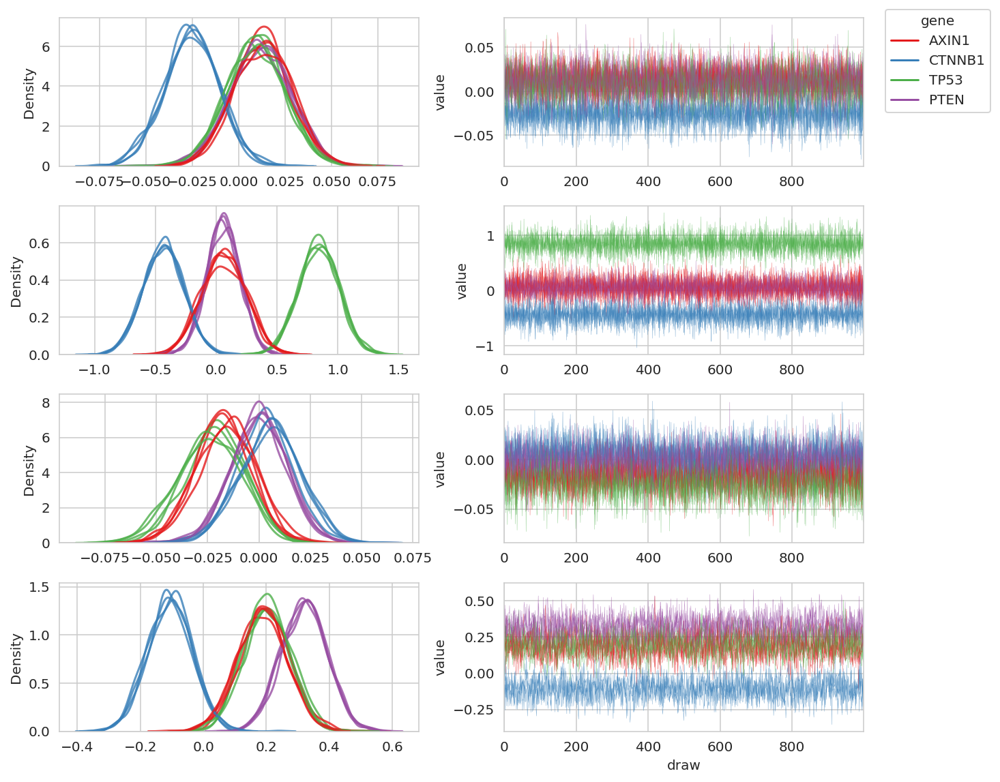

In [73]:
varnames = ["mu_a", "b", "d", "f"]
example_genes = ["AXIN1", "CTNNB1", "TP53", "PTEN"]
gene_effects_post = trace.posterior.get(varnames).sel(gene=example_genes).to_dataframe()

plot_df = (
    gene_effects_post.reset_index(drop=False)
    .pivot_longer(
        index=["chain", "draw", "gene"], names_to="var_name", values_to="value"
    )
    .astype({"chain": "category"})
)

fig, axes = plt.subplots(len(varnames), 2, figsize=(9, len(varnames) * 2))
gene_pal = {
    g: c for g, c in zip(example_genes, sns.mpl_palette("Set1", len(example_genes)))
}

for i, (var_name, data_v) in enumerate(plot_df.groupby("var_name")):
    for c, data_c in data_v.groupby("chain"):
        sns.kdeplot(
            data=data_c,
            x="value",
            hue="gene",
            palette=gene_pal,
            fill=False,
            ax=axes[i, 0],
            alpha=0.8,
        )
        axes[i, 0].set_xlabel(None)
        sns.lineplot(
            data=data_c,
            x="draw",
            y="value",
            hue="gene",
            palette=gene_pal,
            ax=axes[i, 1],
            alpha=0.6,
            lw=0.25,
        )
        axes[i, 1].set_xlim(0, data_c["draw"].max())
        axes[i, 1].set_xlabel(None)

axes[-1, 1].set_xlabel("draw")
for ax in axes.flatten():
    if (leg := ax.get_legend()) is not None:
        leg.remove()

leg_handles = []
for g, c in gene_pal.items():
    leg_handles.append(Line2D([0], [0], color=c, label=g))
fig.legend(handles=leg_handles, title="gene", loc="upper left", bbox_to_anchor=(1, 1))

fig.tight_layout()
plt.show()

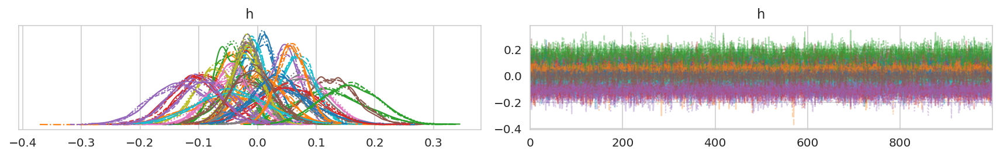

In [74]:
az.plot_trace(
    trace,
    var_names=["h"],
    coords={"gene": example_genes},
    compact=True,
    legend=False,
)
plt.tight_layout()
plt.show()

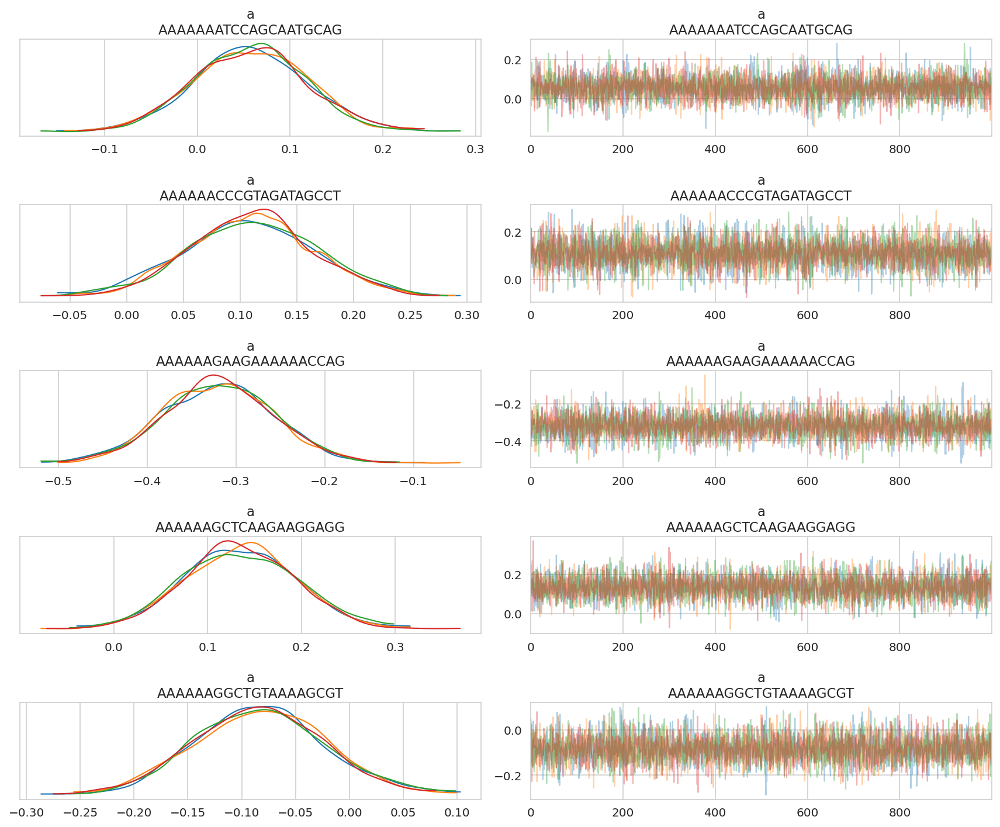

In [29]:
sgrnas_sample = trace.posterior.coords["sgrna"].values[:5]

az.plot_trace(trace, var_names="a", coords={"sgrna": sgrnas_sample}, compact=False)
plt.tight_layout()
plt.show()

🧬 target gene: *KRAS*

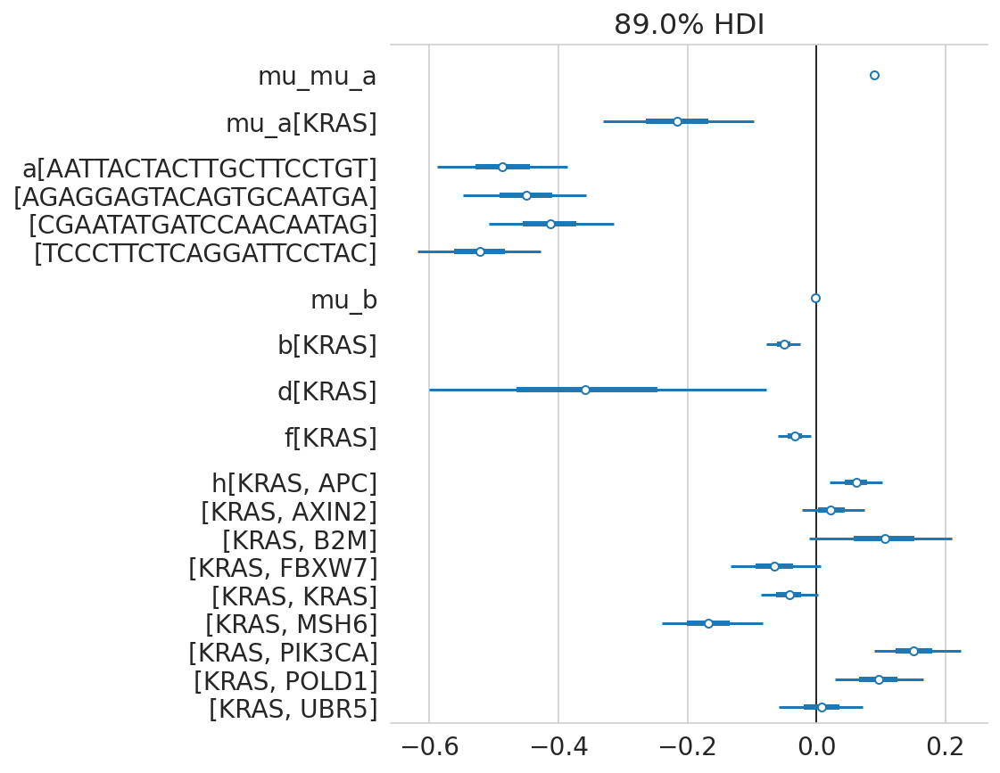

🧬 target gene: *BRAF*

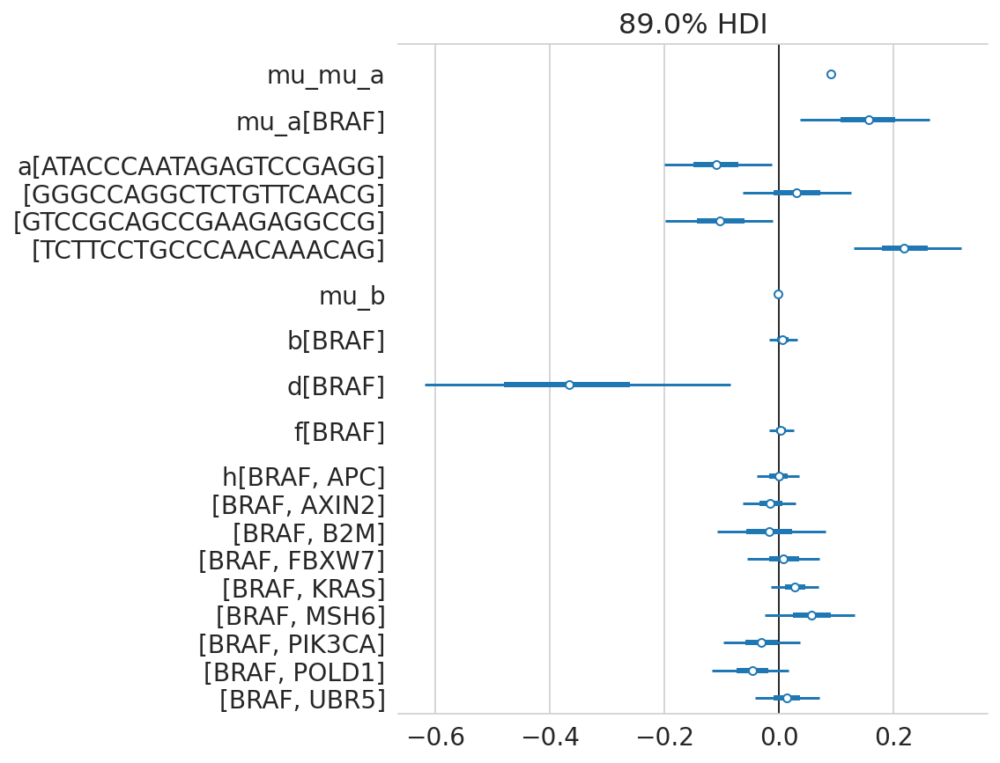

🧬 target gene: *CTNNB1*

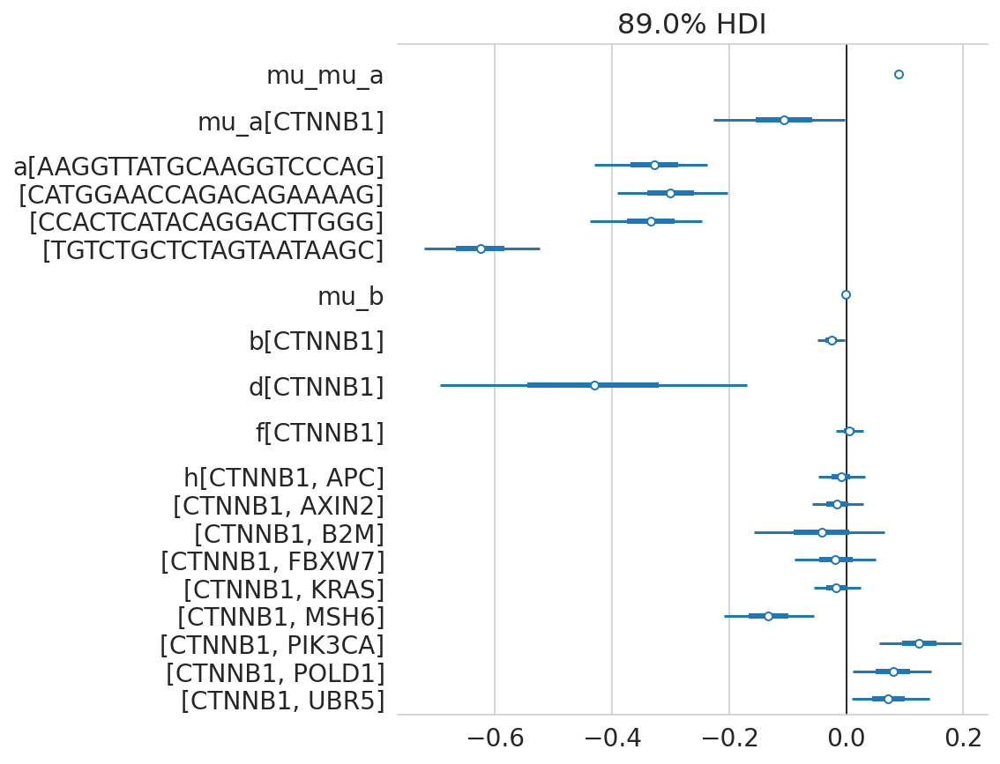

🧬 target gene: *TP53*

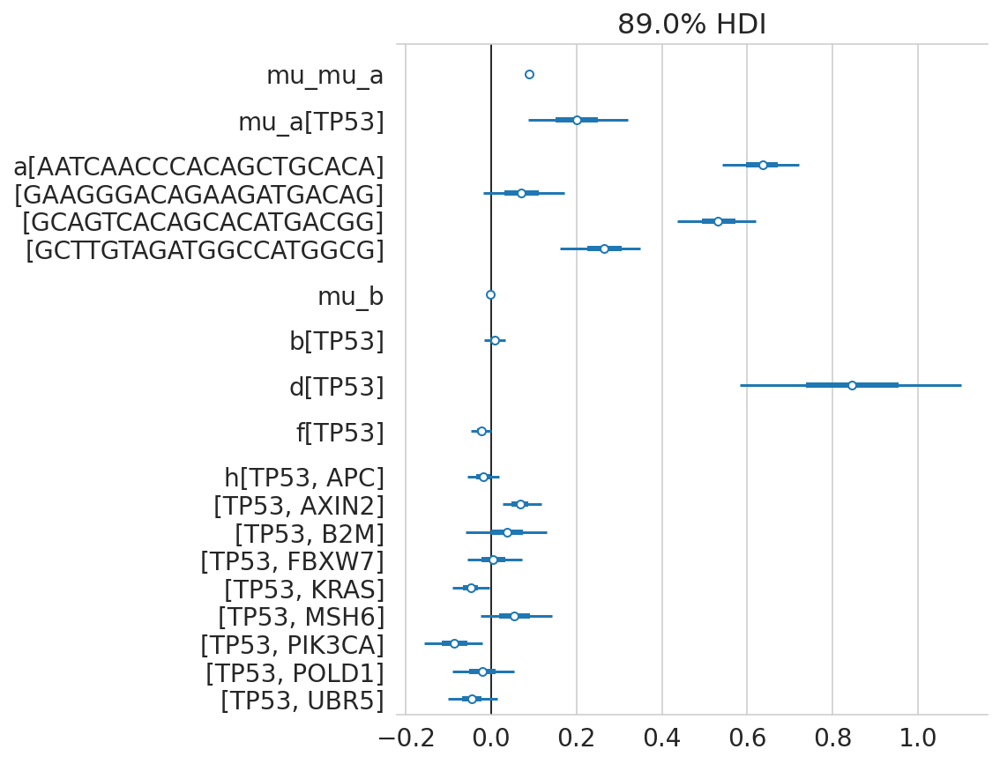

🧬 target gene: *PTEN*

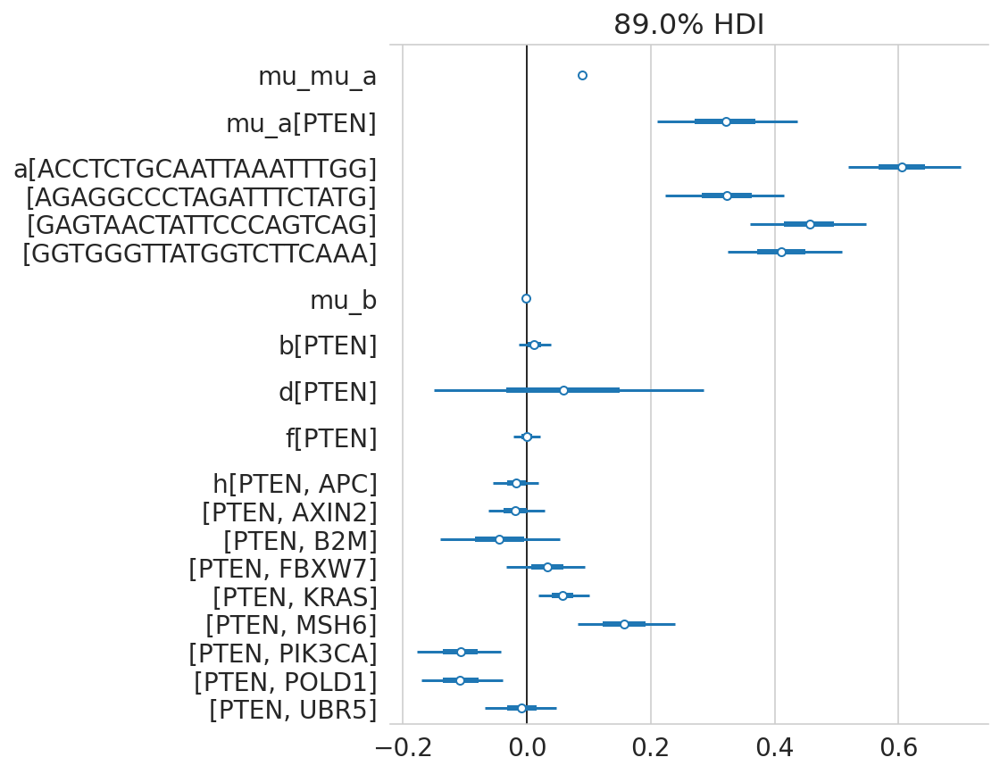

In [77]:
example_genes = ["KRAS", "BRAF", "CTNNB1", "TP53", "PTEN"]
for example_gene in example_genes:
    display(Markdown(f"🧬 target gene: *{example_gene}*"))
    example_gene_sgrna = sgrna_to_gene_map.query(f"hugo_symbol == '{example_gene}'")[
        "sgrna"
    ].tolist()
    axes = az.plot_forest(
        trace,
        var_names=[
            "mu_mu_a",
            "mu_a",
            "a",
            "mu_b",
            "b",
            "d",
            "f",
            "h",
        ],
        coords={"gene": [example_gene], "sgrna": example_gene_sgrna},
        combined=True,
        figsize=(6, 7),
    )
    axes[0].axvline(0, color="k", lw=0.8, zorder=1)
    plt.show()

/home/jc604/.conda/envs/speclet/lib/python3.10/site-packages/arviz/plots/backends/matplotlib/pairplot.py:232: UserWarning: rcParams['plot.max_subplots'] (64) is smaller than the number of resulting pair plots with these variables, generating only a 10x10 grid
  warnings.warn(


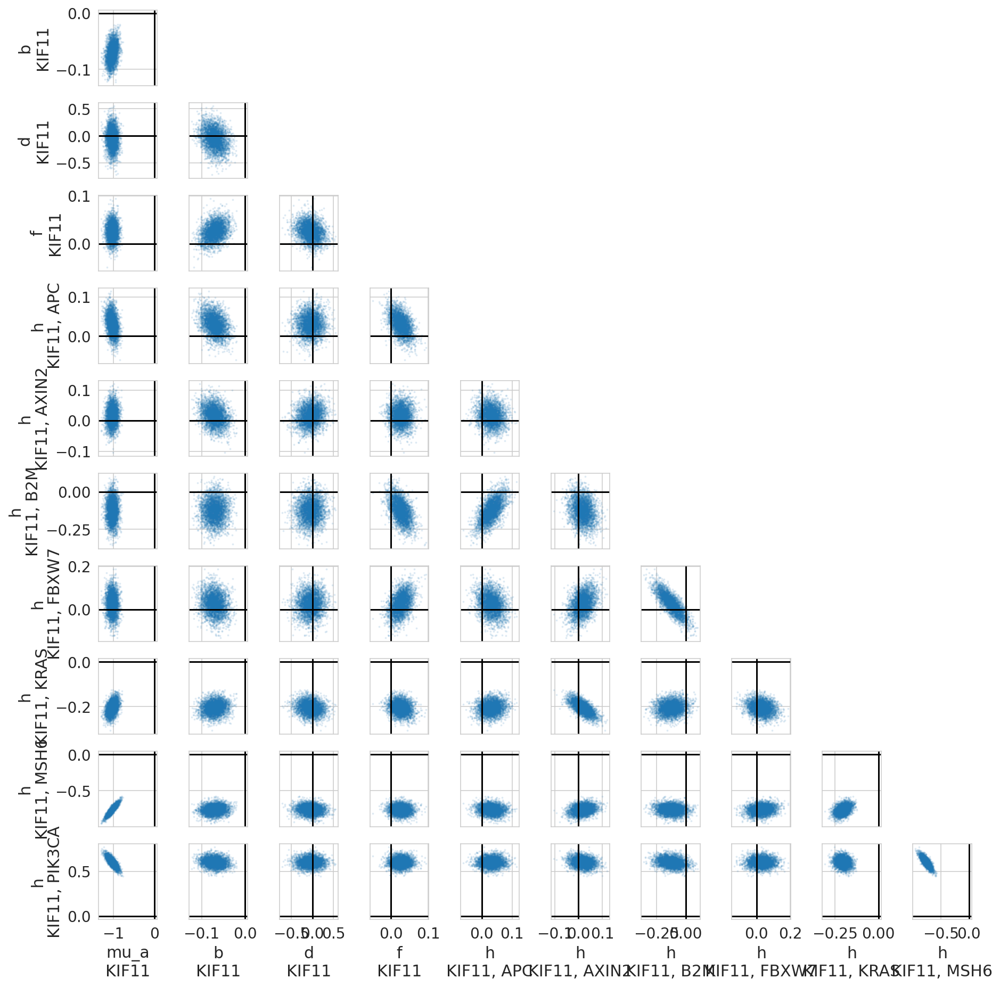

/home/jc604/.conda/envs/speclet/lib/python3.10/site-packages/arviz/plots/backends/matplotlib/pairplot.py:232: UserWarning: rcParams['plot.max_subplots'] (64) is smaller than the number of resulting pair plots with these variables, generating only a 10x10 grid
  warnings.warn(


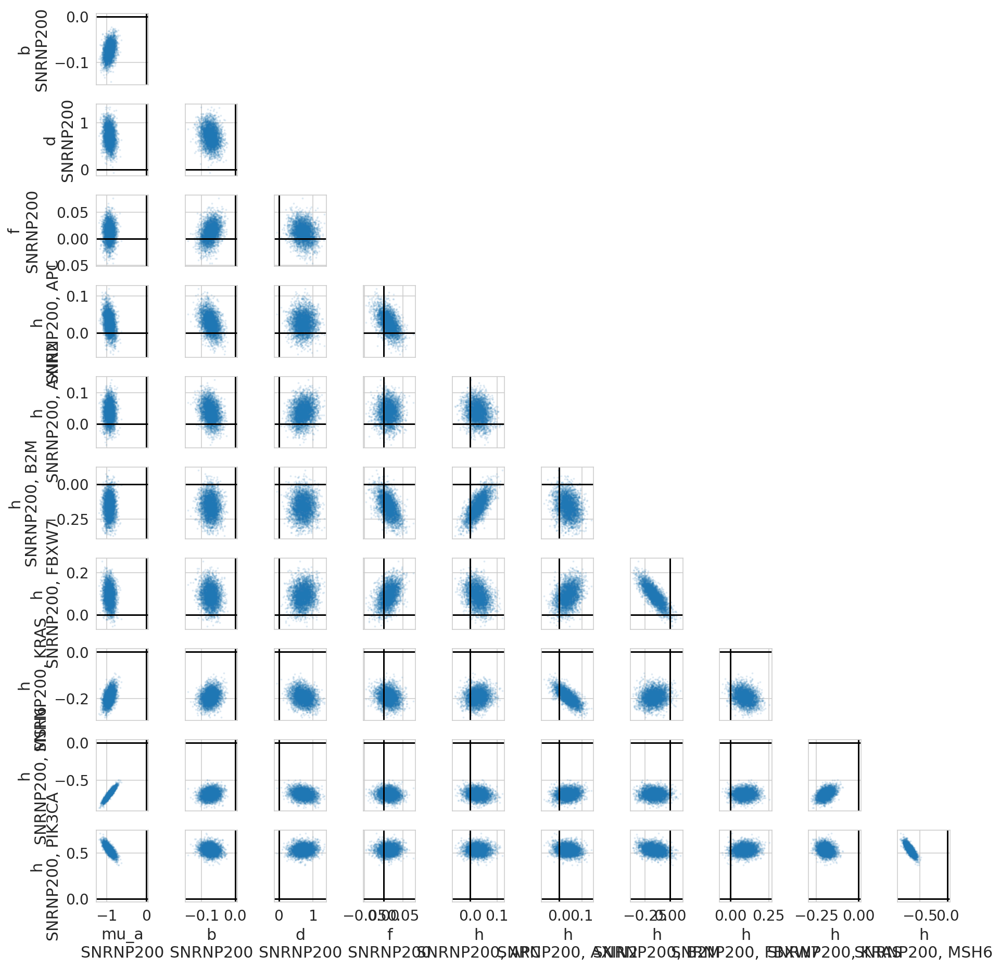

In [80]:
with az.rc_context({"plot.max_subplots": 64}):
    for gene in ["KIF11", "SNRNP200"]:
        axes = az.plot_pair(
            trace,
            var_names=["mu_a", "b", "d", "f", "h"],
            coords={"gene": [gene]},
            figsize=(13, 13),
            scatter_kwargs={"alpha": 0.1, "markersize": 2},
        )
        for ax in axes.flatten():
            ax.axhline(0, color="k")
            ax.axvline(0, color="k")
        plt.tight_layout()
        plt.show()

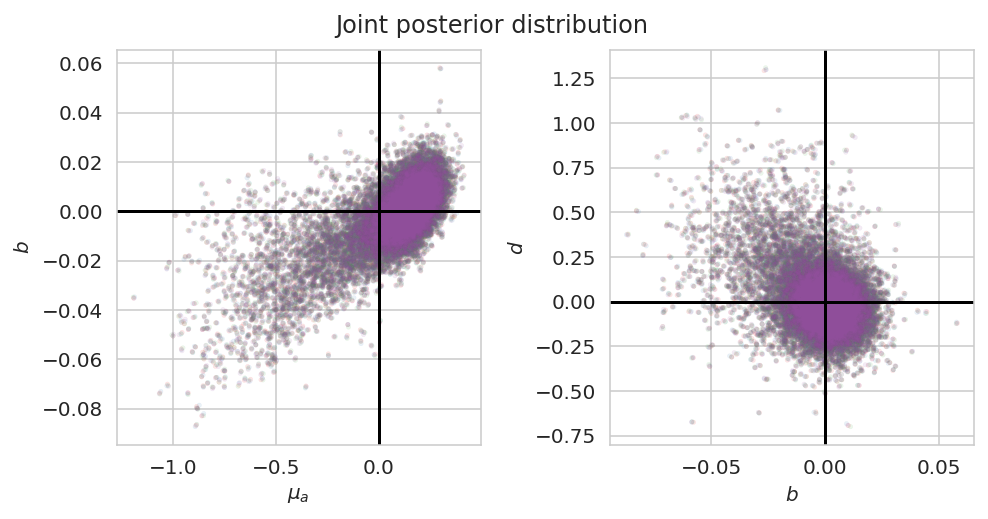

In [81]:
def _get_average_per_chain(trace: az.InferenceData, var_name: str) -> pd.DataFrame:
    return (
        trace.posterior[var_name]
        .mean(axis=(1))
        .to_dataframe()
        .reset_index()
        .astype({"chain": str})
    )


mu_a_post_avg = _get_average_per_chain(trace, "mu_a")
b_post_avg = _get_average_per_chain(trace, "b")
d_post_avg = _get_average_per_chain(trace, "d")

gene_post_avg = mu_a_post_avg.merge(b_post_avg, on=["chain", "gene"]).merge(
    d_post_avg, on=["chain", "gene"]
)


fig, axes = plt.subplots(1, 2, squeeze=True, figsize=(7, 3.5))

ax = axes[0]
sns.scatterplot(
    data=gene_post_avg,
    x="mu_a",
    y="b",
    hue="chain",
    palette="Set1",
    alpha=0.1,
    edgecolor=None,
    s=5,
    ax=ax,
)
ax.set_xlabel(r"$\mu_a$")
ax.set_ylabel(r"$b$")


ax = axes[1]
sns.scatterplot(
    data=gene_post_avg,
    x="b",
    y="d",
    hue="chain",
    palette="Set1",
    alpha=0.1,
    edgecolor=None,
    s=5,
    ax=ax,
)
ax.set_xlabel(r"$b$")
ax.set_ylabel(r"$d$")

for ax in axes.flatten():
    ax.axhline(color="k")
    ax.axvline(color="k")
    ax.get_legend().remove()


fig.tight_layout()
fig.suptitle("Joint posterior distribution", va="bottom")

plt.show()

In [116]:
tp53_muts = (
    valid_crc_data.query("hugo_symbol == 'TP53'")[["depmap_id", "is_mutated"]]
    .copy()
    .drop_duplicates()
    .rename(columns={"is_mutated": "TP53 mut."})
    .reset_index(drop=True)
)

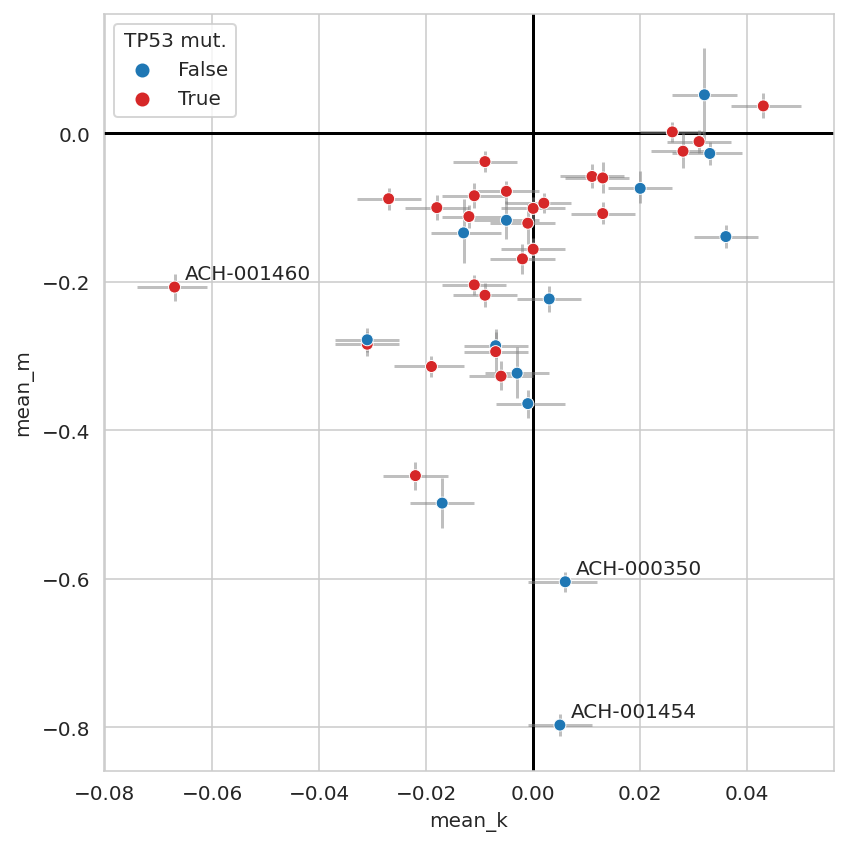

In [124]:
cell_line_vars = ["k", "m"]
cell_line_effects = (
    az.summary(trace, var_names=cell_line_vars, kind="stats")
    .pipe(extract_coords_param_names, names=["depmap_id"])
    .assign(var_name=lambda d: [x[0] for x in d.index.values])
    .pivot_wider(
        index="depmap_id",
        names_from="var_name",
        values_from=["mean", "hdi_5.5%", "hdi_94.5%"],
    )
    .merge(tp53_muts, on="depmap_id")
)

fig, ax = plt.subplots(figsize=(6, 6))

ax.axhline(0, color="k", zorder=1)
ax.axvline(0, color="k", zorder=1)

ax.vlines(
    x=cell_line_effects["mean_k"],
    ymin=cell_line_effects["hdi_5.5%_m"],
    ymax=cell_line_effects["hdi_94.5%_m"],
    alpha=0.5,
    color="gray",
)
ax.hlines(
    y=cell_line_effects["mean_m"],
    xmin=cell_line_effects["hdi_5.5%_k"],
    xmax=cell_line_effects["hdi_94.5%_k"],
    alpha=0.5,
    color="gray",
)
mut_pal = {True: "tab:red", False: "tab:blue"}
sns.scatterplot(
    data=cell_line_effects,
    x="mean_k",
    y="mean_m",
    hue="TP53 mut.",
    palette=mut_pal,
    ax=ax,
    zorder=10,
)

annotate_df = cell_line_effects.query("mean_k < -0.06 or mean_m < -0.5")
for _, info in annotate_df.iterrows():
    ax.text(x=info["mean_k"] + 0.002, y=info["mean_m"] + 0.01, s=info["depmap_id"])

sns.move_legend(ax, loc="upper left")
fig.tight_layout()
plt.show()

In [30]:
genes_var_names = ["mu_a", "b", "d", "f"]
genes_var_names += [f"h[{g}]" for g in trace.posterior.coords["cancer_gene"].values]
gene_corr_post = (
    az.summary(trace, "genes_chol_cov_corr", kind="stats")
    .pipe(extract_coords_param_names, names=["d1", "d2"])
    .astype({"d1": int, "d2": int})
    .assign(
        p1=lambda d: [genes_var_names[i] for i in d["d1"]],
        p2=lambda d: [genes_var_names[i] for i in d["d2"]],
    )
    .assign(
        p1=lambda d: pd.Categorical(d["p1"], categories=d["p1"].unique(), ordered=True)
    )
    .assign(
        p2=lambda d: pd.Categorical(
            d["p2"], categories=d["p1"].cat.categories, ordered=True
        )
    )
)

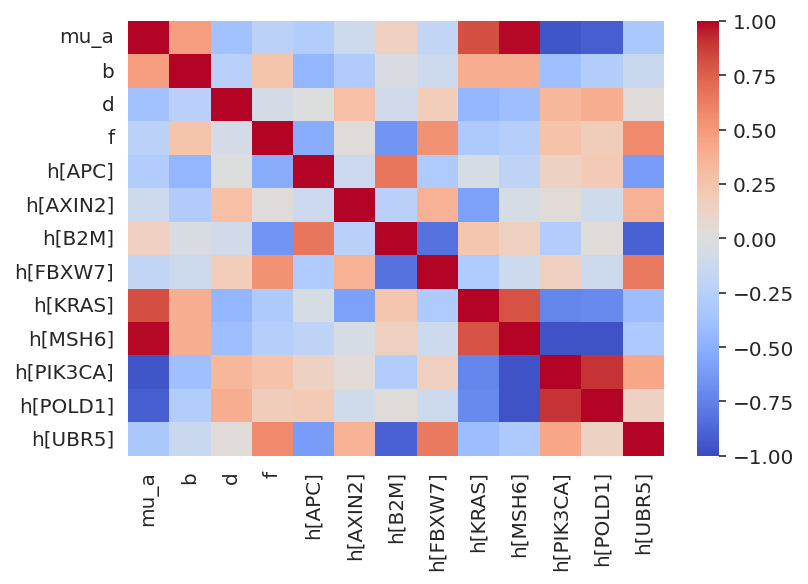

In [31]:
plot_df = gene_corr_post.pivot_wider("p1", "p2", "mean").set_index("p1")
ax = sns.heatmap(
    plot_df,
    cmap="coolwarm",
    vmin=-1,
    vmax=1,
)
ax.set_ylabel(None)
plt.show()

In [32]:
cells_var_names = ["k", "m"]
cells_corr_post = (
    az.summary(trace, "cells_chol_cov_corr", kind="stats")
    .pipe(extract_coords_param_names, names=["d1", "d2"])
    .astype({"d1": int, "d2": int})
    .assign(
        p1=lambda d: [cells_var_names[i] for i in d["d1"]],
        p2=lambda d: [cells_var_names[i] for i in d["d2"]],
    )
    .assign(
        p1=lambda d: pd.Categorical(d["p1"], categories=d["p1"].unique(), ordered=True)
    )
    .assign(
        p2=lambda d: pd.Categorical(
            d["p2"], categories=d["p1"].cat.categories, ordered=True
        )
    )
)

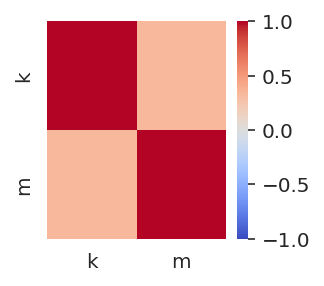

In [33]:
_, ax = plt.subplots(figsize=(2, 2))
plot_df = cells_corr_post.pivot_wider("p1", "p2", "mean").set_index("p1")
sns.heatmap(plot_df, cmap="coolwarm", vmin=-1, vmax=1, ax=ax)
ax.set_ylabel(None)
plt.show()

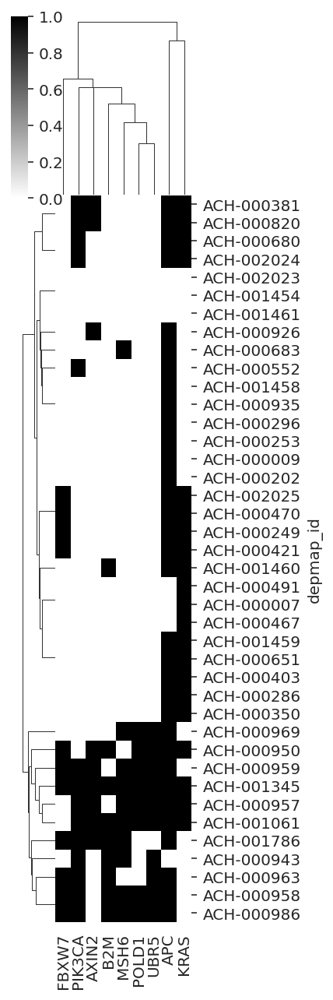

In [158]:
cancer_genes = trace.posterior.coords["cancer_gene"].values.tolist()
cancer_gene_mutants = (
    valid_crc_data.filter_column_isin("hugo_symbol", cancer_genes)[
        ["hugo_symbol", "depmap_id", "is_mutated"]
    ]
    .drop_duplicates()
    # .assign(is_mutated=lambda d: d["is_mutated"].map({True: "X", False: ""}))
    .sort_values(["hugo_symbol", "depmap_id"])
    .pivot_wider("depmap_id", names_from="hugo_symbol", values_from="is_mutated")
    .set_index("depmap_id")
)

sns.clustermap(
    cancer_gene_mutants, cmap="gray_r", xticklabels=1, yticklabels=1, figsize=(3, 9)
);

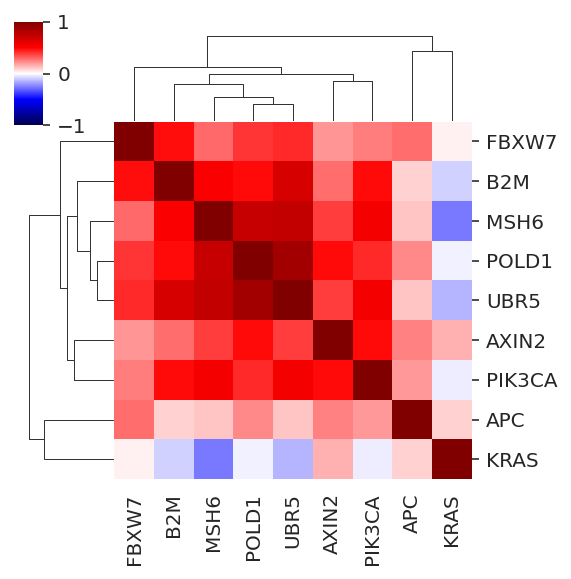

In [163]:
sns.clustermap(
    cancer_gene_mutants.corr(),
    cmap="seismic",
    center=0,
    vmin=-1,
    vmax=1,
    figsize=(4, 4),
);

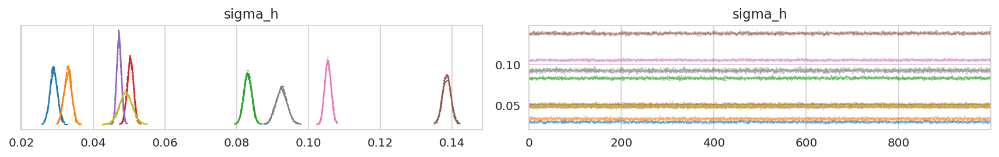

In [129]:
az.plot_trace(trace, var_names=["sigma_h"], compact=True)
plt.tight_layout()
plt.show()

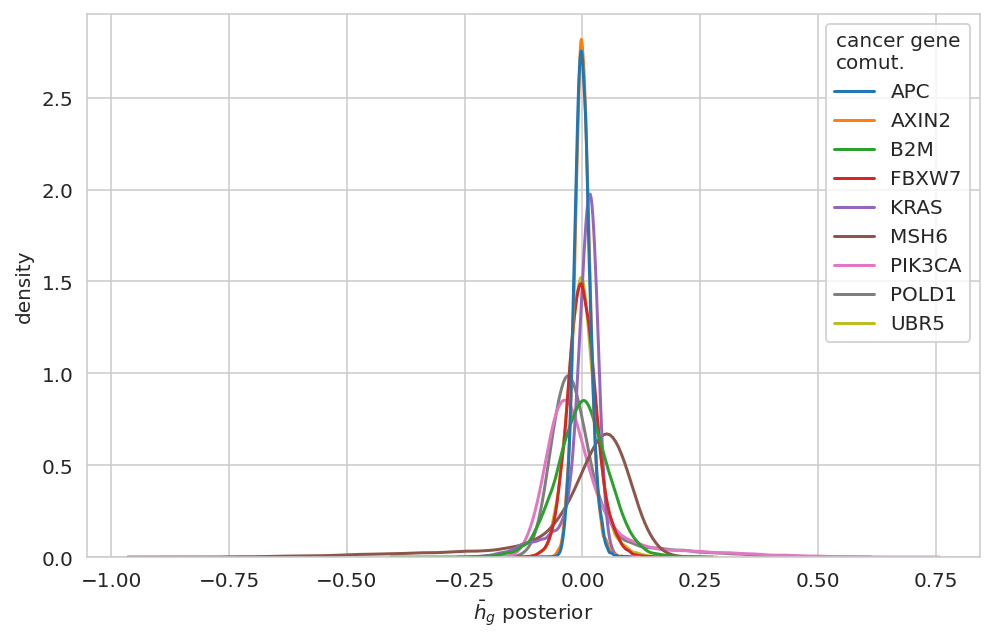

In [131]:
h_post_summary = (
    crc_post_summary.query("var_name == 'h'")
    .reset_index(drop=True)
    .pipe(
        extract_coords_param_names,
        names=["hugo_symbol", "cancer_gene"],
        col="parameter",
    )
)

_, ax = plt.subplots(figsize=(8, 5))
sns.kdeplot(data=h_post_summary, x="mean", hue="cancer_gene", ax=ax)
ax.set_xlabel(r"$\bar{h}_g$ posterior")
ax.set_ylabel("density")
ax.get_legend().set_title("cancer gene\ncomut.")
plt.show()

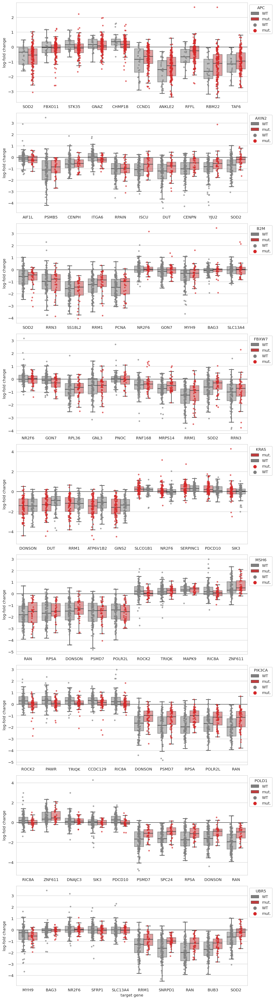

In [132]:
fig, axes = plt.subplots(
    len(cancer_genes), 1, squeeze=False, figsize=(10, len(cancer_genes) * 4)
)
for ax, cg in zip(axes.flatten(), cancer_genes):
    h_hits = (
        h_post_summary.filter_column_isin("cancer_gene", [cg])
        .sort_values("mean")
        .pipe(head_tail, n=5)["hugo_symbol"]
        .tolist()
    )

    h_hits_data = (
        valid_crc_data.filter_column_isin("hugo_symbol", h_hits)
        .merge(cancer_gene_mutants.reset_index(), on="depmap_id")
        .reset_index()
        .astype({"hugo_symbol": str})
        .assign(
            hugo_symbol=lambda d: pd.Categorical(d["hugo_symbol"], categories=h_hits),
            _cg_mut=lambda d: d[cg].map({"X": "mut.", "": "WT"}),
        )
    )
    ax.axhline(0, color="k", lw=0.8)
    cg_mut_pal = {"mut.": "tab:red", "WT": "gray"}
    boxes = sns.boxplot(
        data=h_hits_data,
        x="hugo_symbol",
        y="lfc",
        hue="_cg_mut",
        palette=cg_mut_pal,
        ax=ax,
        showfliers=False,
        boxprops={"alpha": 0.5},
    )
    points = sns.stripplot(
        data=h_hits_data,
        x="hugo_symbol",
        y="lfc",
        hue="_cg_mut",
        dodge=True,
        palette=cg_mut_pal,
        s=4,
        alpha=0.7,
        ax=ax,
    )
    sns.move_legend(ax, loc="upper left", bbox_to_anchor=(1, 1), title=cg)
    ax.set_xlabel(None)
    ax.set_ylabel("log-fold change")

axes[-1, 0].set_xlabel("target gene")
plt.tight_layout()
plt.show()

/home/jc604/.conda/envs/speclet/lib/python3.10/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


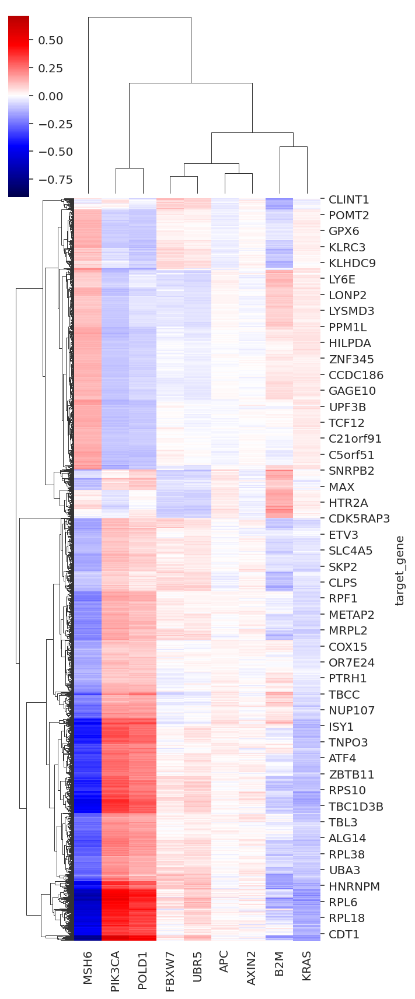

In [149]:
h_post_df = (
    crc_post_summary.query("var_name== 'h'")
    .reset_index(drop=True)
    .pipe(
        extract_coords_param_names,
        names=["target_gene", "cancer_gene"],
        col="parameter",
    )
    .pivot_wider("target_gene", names_from="cancer_gene", values_from="mean")
    .set_index("target_gene")
)

h_gene_var = h_post_df.values.var(axis=1)
idx = h_gene_var >= np.quantile(h_gene_var, q=0.8)
h_post_df_topvar = h_post_df.loc[idx, :]

sns.clustermap(h_post_df_topvar, cmap="seismic", center=0, figsize=(5, 12))

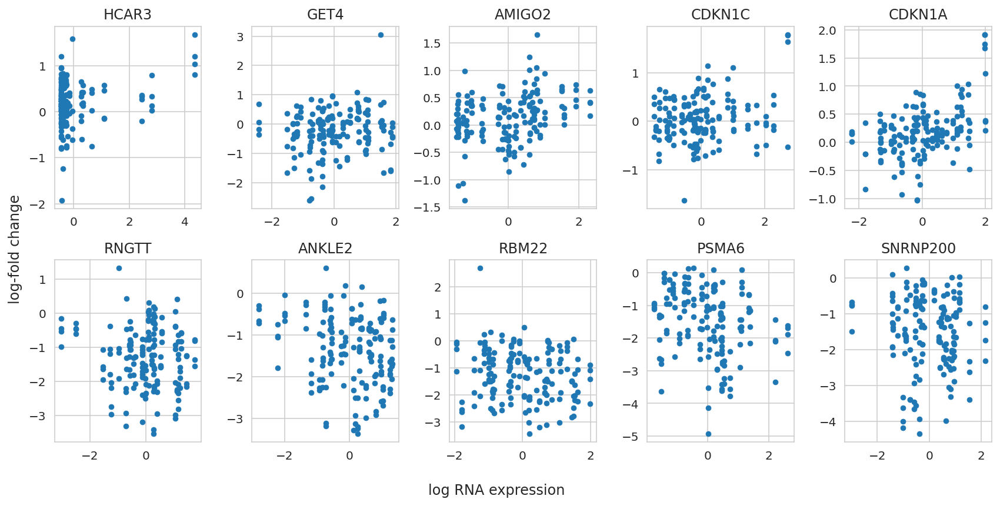

In [164]:
top_n = 5
top_b_hits = (
    crc_post_summary.query("var_name == 'b'")
    .sort_values("mean")
    .reset_index(drop=True)
    .pipe(extract_coords_param_names, names=["hugo_symbol"], col="parameter")
    .pipe(head_tail, n=top_n)
)

negative_b = top_b_hits["hugo_symbol"][:top_n].values
positive_b = top_b_hits["hugo_symbol"][top_n:].values


fig, axes = plt.subplots(2, top_n, figsize=(12, 6))

for i, genes in enumerate([positive_b, negative_b]):
    for j, gene in enumerate(genes):
        ax = axes[i, j]
        ax.set_title(gene)
        obs_data = valid_crc_data.query(f"hugo_symbol == '{gene}'")
        sns.scatterplot(
            data=obs_data, x="m_rna_gene", y="lfc", ax=ax, edgecolor=None, s=20
        )
        ax.set_xlabel(None)
        ax.set_ylabel(None)


fig.supxlabel("log RNA expression")
fig.supylabel("log-fold change")

fig.tight_layout()
plt.show()

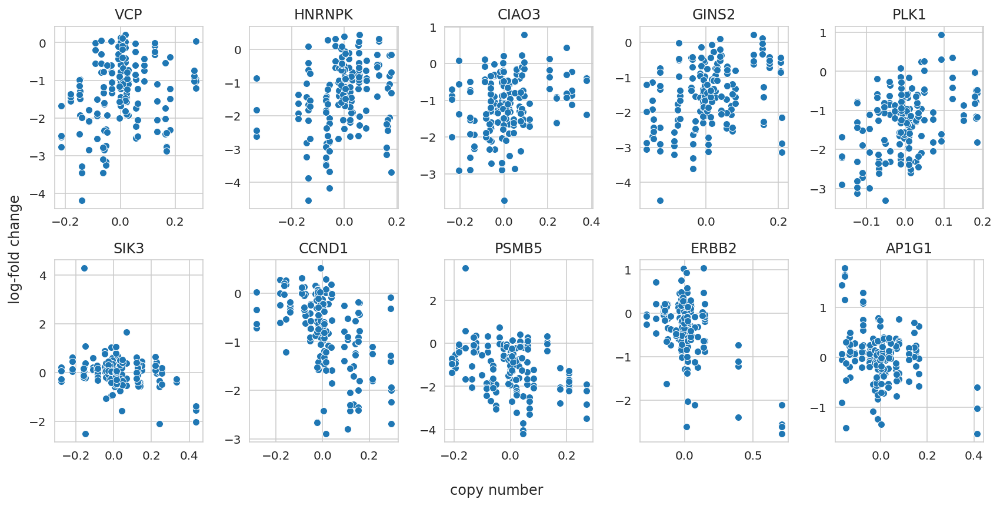

In [165]:
top_n = 5
top_d_hits = (
    crc_post_summary.query("var_name == 'd'")
    .sort_values("mean")
    .reset_index(drop=True)
    .pipe(extract_coords_param_names, names=["hugo_symbol"], col="parameter")
    .pipe(head_tail, n=top_n)
)

negative_d = top_d_hits["hugo_symbol"][:top_n].values
positive_d = top_d_hits["hugo_symbol"][top_n:].values


fig, axes = plt.subplots(2, top_n, figsize=(12, 6))

for i, genes in enumerate([positive_d, negative_d]):
    for j, gene in enumerate(genes):
        ax = axes[i, j]
        ax.set_title(gene)
        obs_data = valid_crc_data.query(f"hugo_symbol == '{gene}'")
        sns.scatterplot(data=obs_data, x="cn_gene", y="lfc", ax=ax)
        ax.set_xlabel(None)
        ax.set_ylabel(None)


fig.supxlabel("copy number")
fig.supylabel("log-fold change")
fig.tight_layout()
plt.show()

## PPC

In [166]:
n_examples = 40
n_chains, n_draws, n_data = trace.posterior_predictive["ct_final"].shape
ex_draws_idx = np.random.choice(
    np.arange(n_draws), size=n_examples // n_chains, replace=False
)
example_ppc_draws = trace.posterior_predictive["ct_final"][
    :, ex_draws_idx, :
].values.reshape(-1, n_data)
example_ppc_draws.shape

(40, 2842455)

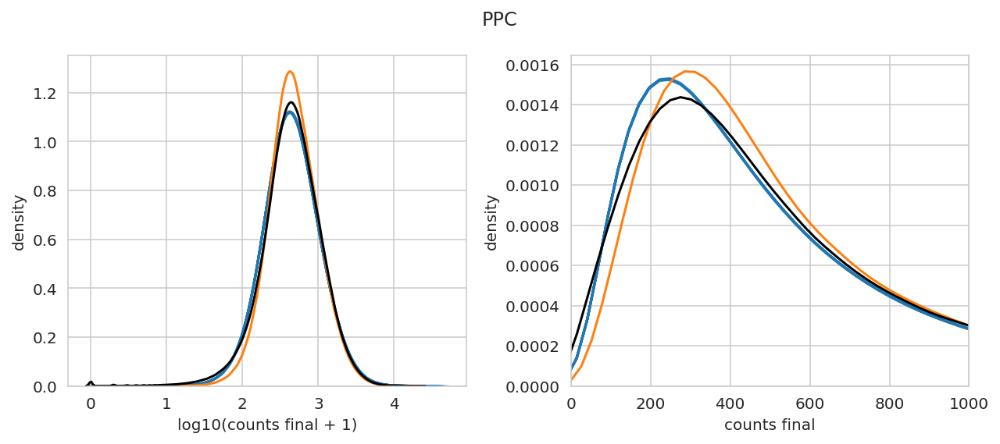

In [167]:
fig, axes = plt.subplots(ncols=2, figsize=(9, 4), sharex=False, sharey=False)
ax1 = axes[0]
ax2 = axes[1]

pp_avg = trace.posterior_predictive["ct_final"].mean(axis=(0, 1))

for i in range(example_ppc_draws.shape[0]):
    sns.kdeplot(
        x=np.log10(example_ppc_draws[i, :] + 1), alpha=0.2, color="tab:blue", ax=ax1
    )

sns.kdeplot(x=np.log10(pp_avg + 1), color="tab:orange", ax=ax1)
sns.kdeplot(x=np.log10(valid_crc_data["counts_final"] + 1), color="k", ax=ax1)
ax1.set_xlabel("log10(counts final + 1)")
ax1.set_ylabel("density")

x_max = 1000
x_cut = x_max * 5
for i in range(example_ppc_draws.shape[0]):
    x = example_ppc_draws[i, :]
    x = x[x < x_cut]
    sns.kdeplot(x=x, alpha=0.2, color="tab:blue", ax=ax2)

sns.kdeplot(x=pp_avg[pp_avg < x_cut], color="tab:orange", ax=ax2)
_obs = valid_crc_data["counts_final"].values
_obs = _obs[_obs < x_cut]
sns.kdeplot(x=_obs, color="k", ax=ax2)
ax2.set_xlabel("counts final")
ax2.set_ylabel("density")
ax2.set_xlim(0, x_max)

fig.suptitle("PPC")
fig.tight_layout()
plt.show()

---

## Session info

In [168]:
notebook_toc = time()
print(f"execution time: {(notebook_toc - notebook_tic) / 60:.2f} minutes")

execution time: 138.87 minutes


In [169]:
%load_ext watermark
%watermark -d -u -v -iv -b -h -m

Last updated: 2022-08-07

Python implementation: CPython
Python version       : 3.10.5
IPython version      : 8.4.0

Compiler    : GCC 10.3.0
OS          : Linux
Release     : 3.10.0-1160.45.1.el7.x86_64
Machine     : x86_64
Processor   : x86_64
CPU cores   : 28
Architecture: 64bit

Hostname: compute-e-16-233.o2.rc.hms.harvard.edu

Git branch: simplify

matplotlib: 3.5.2
numpy     : 1.23.1
pandas    : 1.4.3
arviz     : 0.12.1
seaborn   : 0.11.2

